### Import des bibliothèques nécessaires

In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import geopandas as gpd
from shapely.geometry import Point

# Ignorer les avertissements de Seaborn
warnings.filterwarnings("ignore", category=FutureWarning)

### Chargement des données

In [69]:
df = pd.read_csv("data/p2-arbres-fr.csv", delimiter=";", decimal=",")

In [70]:
df.head()

,id,type_emplacement,domanialite,arrondissement,complement_addresse,numero,lieu,id_emplacement,libelle_francais,genre,espece,variete,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
0,99874,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,19,Marronnier,Aesculus,hippocastanum,NaN,20,5,NaN,0.0,48.8576199541,2.3209621099
1,99875,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,20,If,Taxus,baccata,NaN,65,8,A,NaN,48.8576560697,2.3210314229
2,99876,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,21,If,Taxus,baccata,NaN,90,10,A,NaN,48.8577050069,2.321060566
3,99877,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,22,Erable,Acer,negundo,NaN,60,8,A,NaN,48.8577220449,2.3210058253
4,99878,Arbre,Jardin,PARIS 17E ARRDT,NaN,NaN,PARC CLICHY-BATIGNOLLES-MARTIN LUTHER KING,000G0037,Arbre à miel,Tetradium,daniellii,NaN,38,0,NaN,NaN,48.8904352883,2.3152894588


### Prétraitement des données et nettoyage

In [71]:
df.columns = [col.lower().replace(" ", "_") for col in df.columns]

In [72]:
df.describe()

,id,numero,circonference_cm,hauteur_m,remarquable
count,2.001370e+05,0.0,200137.000000,200137.000000,137039.000000
mean,3.872027e+05,NaN,83.380479,13.110509,0.001343
std,5.456032e+05,NaN,673.190213,1971.217387,0.036618
min,9.987400e+04,NaN,0.000000,0.000000,0.000000
25%,1.559270e+05,NaN,30.000000,5.000000,0.000000
50%,2.210780e+05,NaN,70.000000,8.000000,0.000000
75%,2.741020e+05,NaN,115.000000,12.000000,0.000000
max,2.024745e+06,NaN,250255.000000,881818.000000,1.000000


In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200137 entries, 0 to 200136
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   200137 non-null  int64  
 1   type_emplacement     200137 non-null  object 
 2   domanialite          200136 non-null  object 
 3   arrondissement       200137 non-null  object 
 4   complement_addresse  30902 non-null   object 
 5   numero               0 non-null       float64
 6   lieu                 200137 non-null  object 
 7   id_emplacement       200137 non-null  object 
 8   libelle_francais     198640 non-null  object 
 9   genre                200121 non-null  object 
 10  espece               198385 non-null  object 
 11  variete              36777 non-null   object 
 12  circonference_cm     200137 non-null  int64  
 13  hauteur_m            200137 non-null  int64  
 14  stade_developpement  132932 non-null  object 
 15  remarquable      

### Suppression des colonnes non pertinentes pour l'analyse

In [74]:
#id est une valeur unique pour chaque ligne
#id emplacement et complements addresse ne nous intéressent pas
#geopoint sont des informations trop précise, nous utiliserons l'arrondissement
df.drop(columns=["id", "id_emplacement", "complement_addresse",
                 "geo_point_2d_a", "geo_point_2d_b"], inplace=True)

### 1. Présentation générale du jeu de données

Le dataset contient des informations sur les arbres présents dans différentes localisations urbaines. 

Les colonnes comprennent des caractéristiques telles que la circonférence, la hauteur, le genre, l'espèce, etc. 

Notre objectif est d'aider les agents d'entretiens des arbres à optimiser leurs tournées.


### 2. Analyse exploratoire des données

<Figure size 1000x600 with 0 Axes>

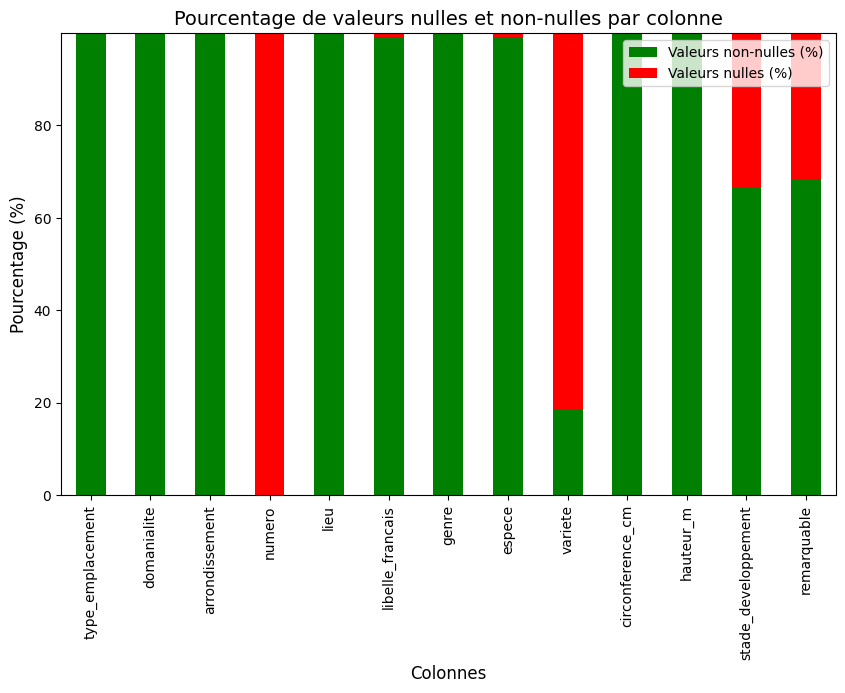

In [75]:
# Analyse des valeurs manquantes
# Visualisation des pourcentages de valeurs nulles et non nulles


pourcentage_null = (df.isnull().sum() / len(df)) * 100
pourcentage_non_null = 100 - pourcentage_null


pourcentage_df = pd.DataFrame({
    'Valeurs nulles (%)': pourcentage_null,
    'Valeurs non-nulles (%)': pourcentage_non_null
})

# Créer un graphique en barres empilées
plt.figure(figsize=(10, 6))
pourcentage_df[['Valeurs non-nulles (%)', 'Valeurs nulles (%)']].plot(
    kind='bar', stacked=True, color=['green', 'red'], figsize=(10, 6))

# Ajouter des labels et un titre
plt.title('Pourcentage de valeurs nulles et non-nulles par colonne', fontsize=14)
plt.xlabel('Colonnes', fontsize=12)
plt.ylabel('Pourcentage (%)', fontsize=12)

# Afficher la légende et le graphique
plt.legend(loc='upper right')
plt.show()


In [76]:
# suppression des colones plus de 40 % de valeurs manquantes

df.drop(columns=["numero", "variete"], inplace=True)

In [112]:
# remplacement des valeurs null pour remarquable (on remplace par la valeur la plus présente)
print(df["remarquable"].value_counts())
df["remarquable"] = df["remarquable"].fillna(0)

remarquable
0.0    199953
1.0       184
Name: count, dtype: int64


### 3. Analyse des variables numériques

In [78]:
# Sélection des colonnes numériques

df_number = df.select_dtypes(include=["number"])
df_number.drop(columns=["remarquable"], inplace=True)
df_number.describe()

,circonference_cm,hauteur_m
count,200137.000000,200137.000000
mean,83.380479,13.110509
std,673.190213,1971.217387
min,0.000000,0.000000
25%,30.000000,5.000000
50%,70.000000,8.000000
75%,115.000000,12.000000
max,250255.000000,881818.000000


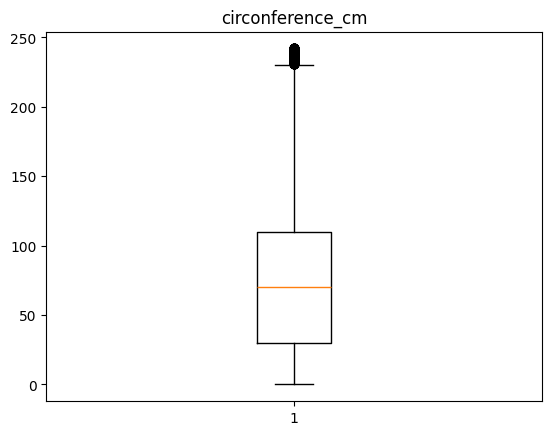

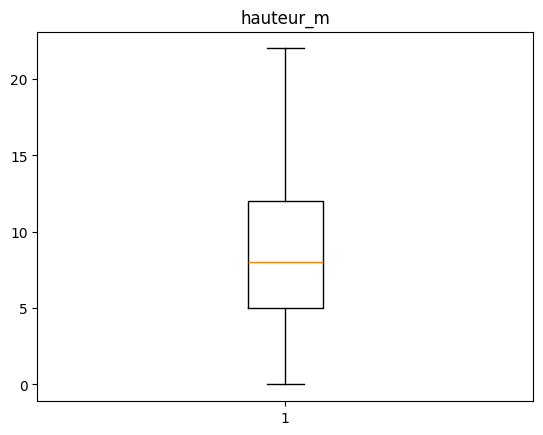

In [79]:
## affichage des boxplot en mettant de cote les outliers
for col in df_number.columns:

    # calcule du IQR (Interquartile Range)
    Q1 = df_number[col].quantile(0.25)
    Q3 = df_number[col].quantile(0.75)
    IQR = Q3 - Q1

    # identification des outliers
    threshold = 1.5
    outliers = df_number[col][(df_number[col] < Q1 - threshold * IQR) | (df[col] > Q3 + threshold * IQR)]

    box = df_number[col].drop(outliers.index)
    plt.title(col)
    plt.boxplot(box)
    plt.show()

- Nous supprimons les arbre dont la hauteur ou la circonférence sont égale à zéro

In [80]:
df_number = df_number.loc[-(df_number["hauteur_m"]==0)]
df_number = df_number.loc[-(df_number["circonference_cm"]==0)]


In [81]:
## info outlier

for col in df_number.columns:

    # calcule du IQR (Interquartile Range)
    Q1 = df_number[col].quantile(0.25)
    Q3 = df_number[col].quantile(0.75)
    IQR = Q3 - Q1

    # identification des outliers
    threshold = 1.5
    outliers = df_number[col][(df_number[col] < Q1 - threshold * IQR) | (df[col] > Q3 + threshold * IQR)]

    count_outliers = outliers.shape[0]
    max_value = outliers.max()
    min_value = outliers.min()

    print(f"{col}\nnombre d'outliers: {count_outliers}\nValeur max: {max_value}\nValeur min: {min_value}\n")
    

circonference_cm
nombre d'outliers: 3713
Valeur max: 250255
Valeur min: 238

hauteur_m
nombre d'outliers: 1234
Valeur max: 881818
Valeur min: 27



- certaines valeurs doivent etre des erreur car nous pouvons supposer qu'un arbe de 881818m n'existe pas
- un des plus grands arbre de paris mesure 30m et un des arbres avec la plus grande circonférence messure 6,05m de circonférence  
- je retire les arbres avec des valeurs plus grande que cela.
https://agriculture.gouv.fr/lun-des-plus-grands-arbres-de-paris-veille-sur-le-78-rue-de-varenne

In [82]:
## l'arbre le plus haut de paris faut 30m selon agriculture.gouv.fr
## retirons les valeurs de la hauteur dépassant les 30m 
#élimination de toutes les valeur ou la circonférence est au dessus de 605cm

df_number = df_number.loc[(df_number["hauteur_m"]<= 30)]
df_number = df_number.loc[(df_number["circonference_cm"]< 605)]

<Axes: xlabel='hauteur_m', ylabel='circonference_cm'>

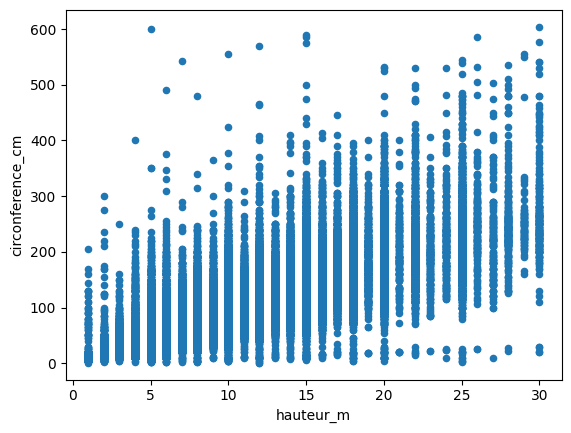

In [83]:
# graphique de l'évolution de la hauteur en fonction de la circonférence

df_number.plot.scatter(x="hauteur_m", y="circonference_cm")

<Axes: xlabel='hauteur_m', ylabel='circonference_cm'>

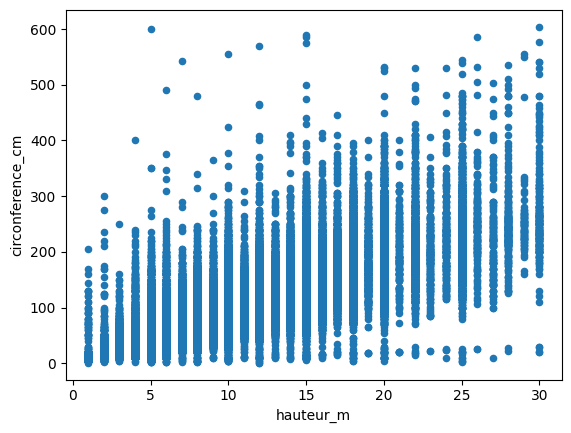

In [84]:
# graphique de l'évolution de la hauteur en fonction de la circonférence

df_number.plot.scatter(x="hauteur_m", y="circonference_cm")

### 4. Analyse des variables catégorielles 

In [85]:
# Sélection des colonnes catégorielles
df_object = df.select_dtypes(include=["object"])
df_object["remarquable"] = df["remarquable"]



In [86]:
# affichage du nombre de valeur unique

for col in df_object:
    print(col,"a",len(df_object[col].value_counts()), "valeur(s) unique(s)")

print("Nombre de ligne du df_object:", df_object.shape[0])

type_emplacement a 1 valeur(s) unique(s)
domanialite a 9 valeur(s) unique(s)
arrondissement a 25 valeur(s) unique(s)
lieu a 6921 valeur(s) unique(s)
libelle_francais a 192 valeur(s) unique(s)
genre a 175 valeur(s) unique(s)
espece a 539 valeur(s) unique(s)
stade_developpement a 4 valeur(s) unique(s)
remarquable a 2 valeur(s) unique(s)
Nombre de ligne du df_object: 200137


In [87]:
#suppression de type_emplacement qui a qu'une seule valeur
#suppression de lieu qui a trop de valeur
df_object.drop(columns=["type_emplacement", "lieu"], inplace=True)

domanialite - Nombre d'échantillon MAX d'une catégorie:104949
domanialite - Nombre d'échantillon MIN d'une catégorie:4


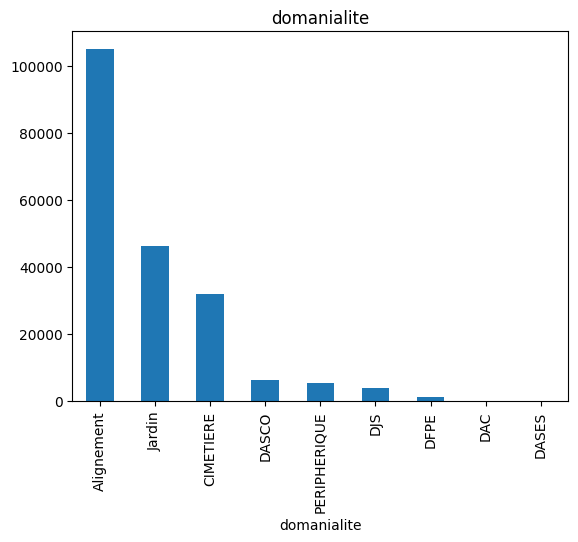

arrondissement - Nombre d'échantillon MAX d'une catégorie:17151
arrondissement - Nombre d'échantillon MIN d'une catégorie:548


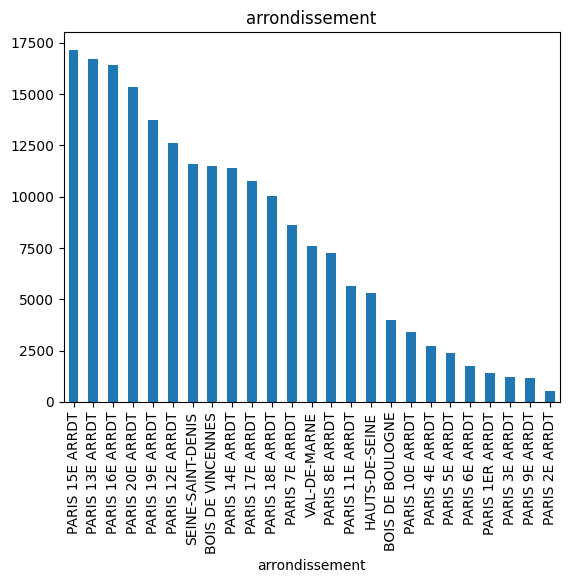

libelle_francais - Nombre d'échantillon MAX d'une catégorie:42508
libelle_francais - Nombre d'échantillon MIN d'une catégorie:1


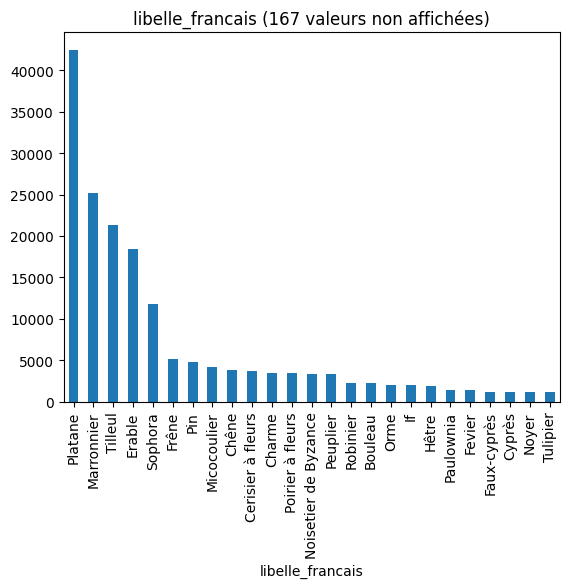

genre - Nombre d'échantillon MAX d'une catégorie:42591
genre - Nombre d'échantillon MIN d'une catégorie:1


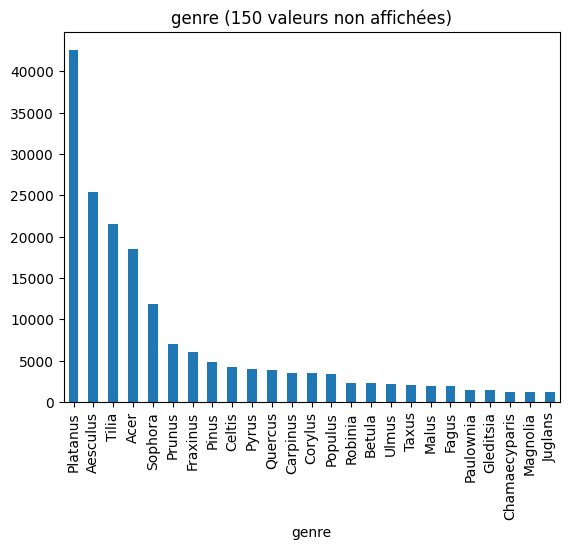

espece - Nombre d'échantillon MAX d'une catégorie:36409
espece - Nombre d'échantillon MIN d'une catégorie:1


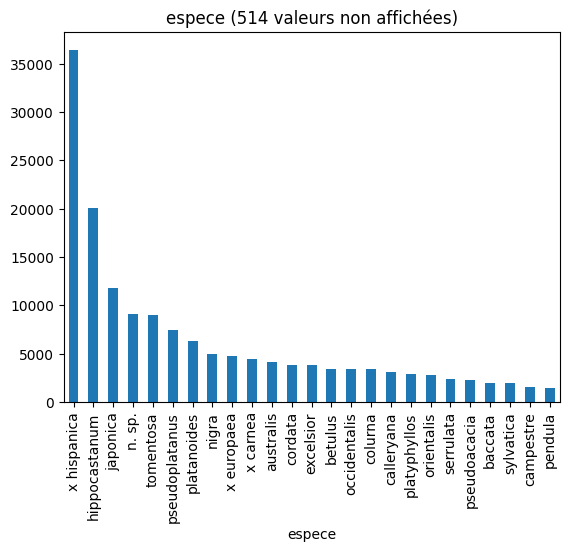

stade_developpement - Nombre d'échantillon MAX d'une catégorie:64438
stade_developpement - Nombre d'échantillon MIN d'une catégorie:6113


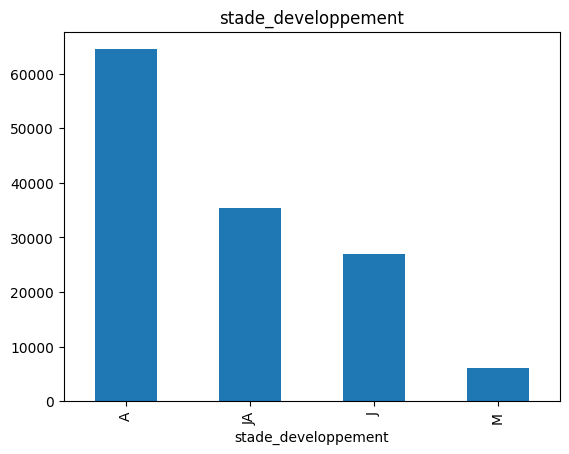

remarquable - Nombre d'échantillon MAX d'une catégorie:199953
remarquable - Nombre d'échantillon MIN d'une catégorie:184


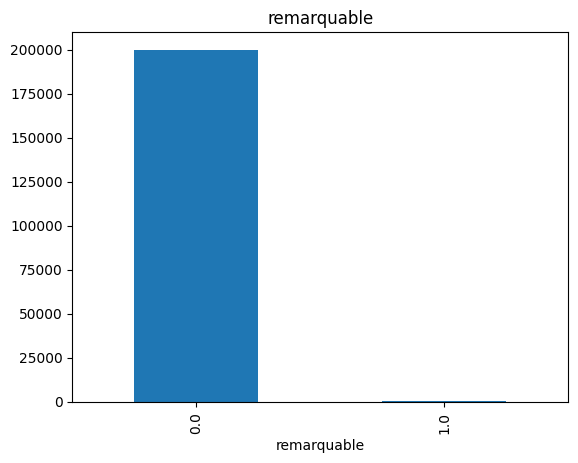

In [88]:
# distribution des valeurs (25 valeurs affichés max)

for col in df_object:
    title = f"{col}"
    
    value_counts = df_object[col].value_counts()

    if len(value_counts) > 25:
        title = f"{title} ({len(value_counts) - 25} valeurs non affichées)"
    value_counts.head(25).plot(kind="bar", title=title)
    print(f"{col} - Nombre d'échantillon MAX d'une catégorie:{value_counts.max()}")
    print(f"{col} - Nombre d'échantillon MIN d'une catégorie:{value_counts.min()}")
    plt.show()
    

nous pouvons voir que les arrondissements les plus peuplés sont:
- le 15 eme
- le 13 eme
- le 16 eme 
ces arrondissements demanderont beaucoup plus d'entretiens

En revanche les arrondissements les moins peuplés demanderont beaucoup moins de travail, par exemple le 2eme

nous pouvons voir que les 3 domanialite les plus représenté sont:
- Allignement
- Jardin
- cimetiere
ces domanialite demanderont beaucoup plus de temps que les autres et donc il serait intéressant de s'intéresser à eux en particulier et de les optimiser 

Les especes les plus présentes qui demanderons le plus de temps d'entretiens sont:
- x Hispanica
-  hippocastanum
- japanica

In [89]:
# Genre et libelle_francais contiennent le meme type d'information mais dans 2 langues avec une répartition similaire

df_object.drop(columns=["libelle_francais"], inplace=True) 

In [90]:
#concernant la colonnes Genre, nous avons au moins un catégorie avec une seule ligne
#regardons combien de catégorie ont moins de 500 lignes et retirons les (pas assez d'echantillons pour qu'elles soient pertinente)

under_500 = df_object["genre"].value_counts().loc[df_object["genre"].value_counts()<500]
cat_500 = under_500.index
under_500

genre
Crataegus        493
Lagerstroemia    460
Sorbus           459
Salix            399
Amelanchier      380
                ... 
Genista            1
Sciadopitys        1
Xanthoceras        1
x Sorbopyrus       1
Garrya             1
Name: count, Length: 133, dtype: int64

In [91]:
df_object = df_object.loc[-(df_object["genre"].isin(cat_500))]

In [92]:
df_object["genre"].value_counts()

genre
Platanus             42591
Aesculus             25341
Tilia                21550
Acer                 18471
Sophora              11830
Prunus                7053
Fraxinus              6014
Pinus                 4861
Celtis                4276
Pyrus                 3928
Quercus               3887
Carpinus              3495
Corylus               3463
Populus               3352
Robinia               2317
Betula                2262
Ulmus                 2133
Taxus                 2018
Malus                 1955
Fagus                 1929
Paulownia             1415
Gleditsia             1413
Chamaecyparis         1219
Magnolia              1133
Juglans               1132
Liriodendron          1129
Toona                 1071
Cercis                1019
Pterocarya            1000
Ailanthus              956
Ginkgo                 940
Cedrus                 911
Liquidambar            701
x Cupressocyparis      680
Morus                  679
Alnus                  675
Koelreuteria          

### redéfinition du dataset pour les analyse croisé

In [93]:
df_final = df[list(df_number.columns) + list(df_object.columns)]
df_final = df_final.loc[(df_number.index)]

### 5.Visualisation de la hauteur et de la circonférence des arbre remarquable

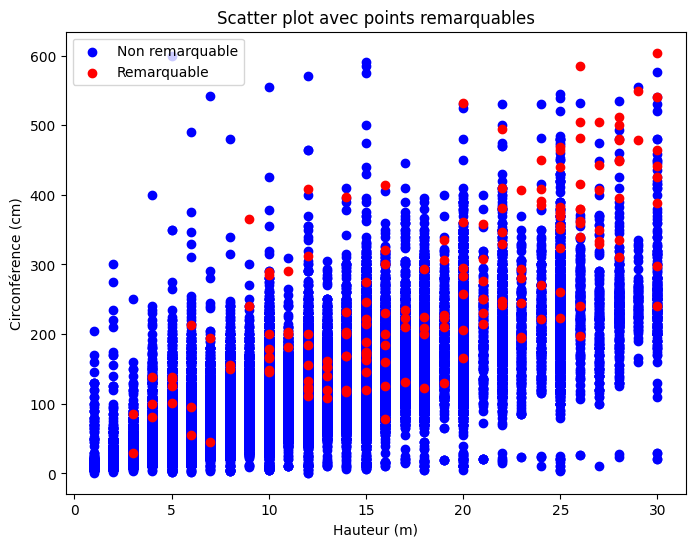

In [94]:
# Création d'un scatter plot
plt.figure(figsize=(8, 6))

# Séparation des points remarquables et non remarquables
non_remarquables = df_final[df_final['remarquable'] == False]
remarquables = df_final[df_final['remarquable'] == True]

# Tracé des points non remarquables (couleur par défaut)
plt.scatter(non_remarquables['hauteur_m'], non_remarquables['circonference_cm'], 
            color='blue', label='Non remarquable')

# Tracé des points remarquables (couleur différente)
plt.scatter(remarquables['hauteur_m'], remarquables['circonference_cm'], 
            color='red', label='Remarquable')

# Ajout de légende, titre, etc.
plt.xlabel('Hauteur (m)')
plt.ylabel('Circonférence (cm)')
plt.title('Scatter plot avec points remarquables')
plt.legend()

# Affichage du graphique
plt.show()

### 6.Visualisation de la hauteur et de la circonférence par raport au stade de développement

In [95]:
df_final["stade_developpement"].unique()

array([nan, 'A', 'J', 'M', 'JA'], dtype=object)

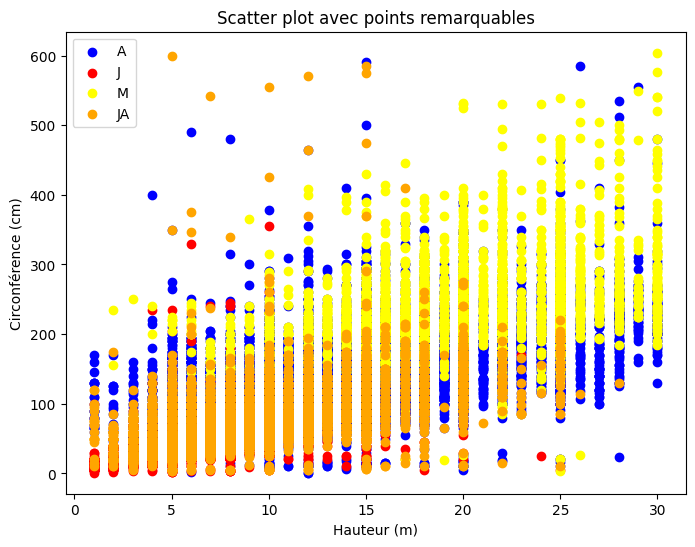

In [96]:
# Création d'un scatter plot
plt.figure(figsize=(8, 6))

# Séparation des points remarquables et non remarquables
stade_j = df_final[df_final['stade_developpement'] == "J"]
stade_m = df_final[df_final['stade_developpement'] == "M"]
stade_ja = df_final[df_final['stade_developpement'] == "JA"]
stade_A = df_final[df_final['stade_developpement'] == "A"]
stade_Nan = df_final[df_final['stade_developpement'].isna()]


# Tracé des points non remarquables (couleur par défaut)
plt.scatter(stade_A['hauteur_m'], stade_A['circonference_cm'], 
            color='blue', label='A')

# Tracé des points remarquables (couleur différente)
plt.scatter(stade_j['hauteur_m'], stade_j['circonference_cm'], 
            color='red', label='J')

# Tracé des points non remarquables (couleur par défaut)
plt.scatter(stade_m['hauteur_m'], stade_m['circonference_cm'], 
            color='yellow', label='M')

# Tracé des points remarquables (couleur différente)
plt.scatter(stade_ja['hauteur_m'], stade_ja['circonference_cm'], 
            color='orange', label='JA')

# Tracé des points non remarquables (couleur par défaut)
# plt.scatter(stade_Nan['hauteur_m'], stade_Nan['circonference_cm'], 
#             color='purple', label='Null')



# Ajout de légende, titre, etc.
plt.xlabel('Hauteur (m)')
plt.ylabel('Circonférence (cm)')
plt.title('Scatter plot avec points remarquables')
plt.legend()

# Affichage du graphique
plt.show()

### 7.Visualisation de la hauteur et de la circonférence par raport a l'arrondissement

In [97]:
## je trie par especes avec le plus de valeur dans le dataset pour visualiser les grapphique les plus représentatif de la réalité en premier
sort_dict = {}
i = 0
df_final["sort_value"] = [0 for i in range(df_final.shape[0])]
for key in df_final["genre"].value_counts().index:
    df_final.loc[(df_final["genre"]==key), "sort_value"] = i
    i+=1


In [98]:
df_final.sort_values(by="sort_value", inplace=True)
df_final.drop(columns=["sort_value"], inplace=True)

In [99]:
len(df_final["genre"].unique())

146

In [100]:
df_final.columns

Index(['circonference_cm', 'hauteur_m', 'domanialite', 'arrondissement',
       'genre', 'espece', 'stade_developpement', 'remarquable'],
      dtype='object')

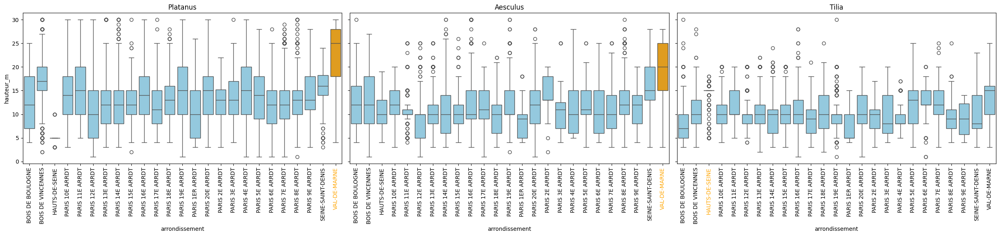

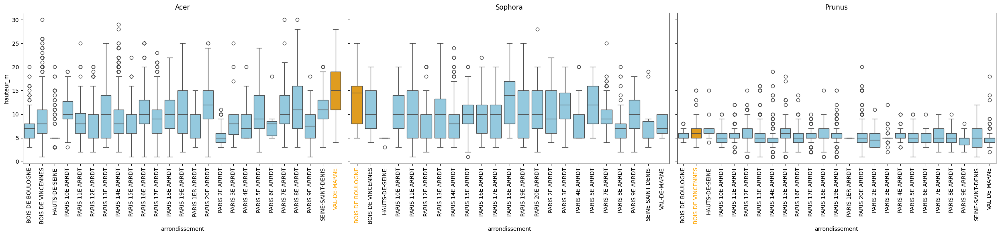

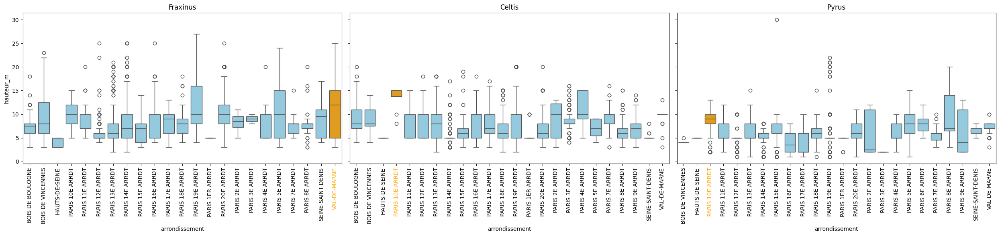

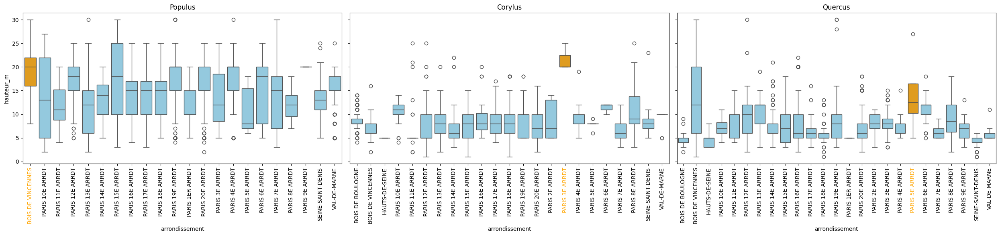

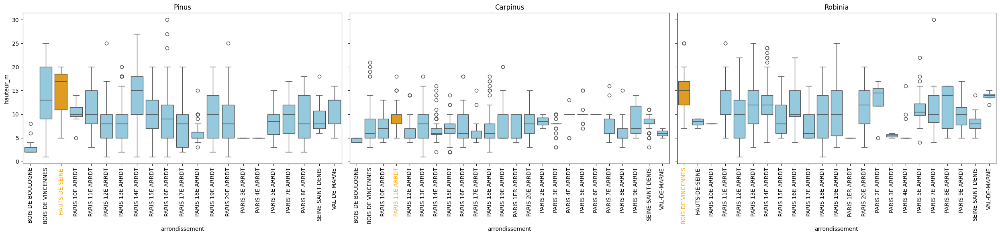

...

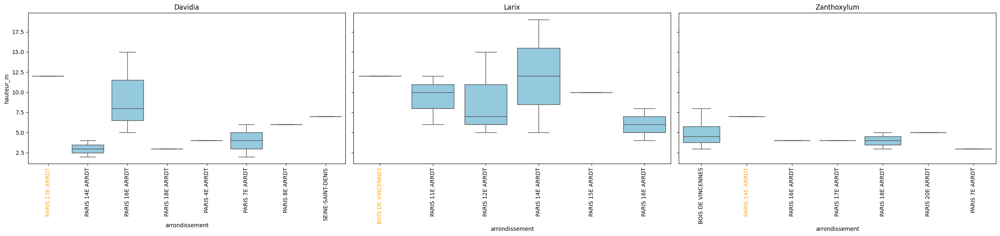

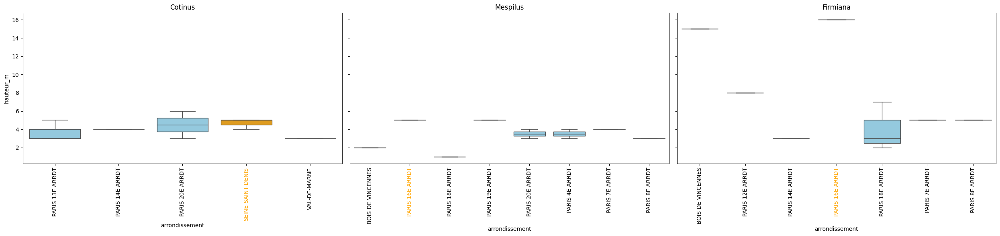

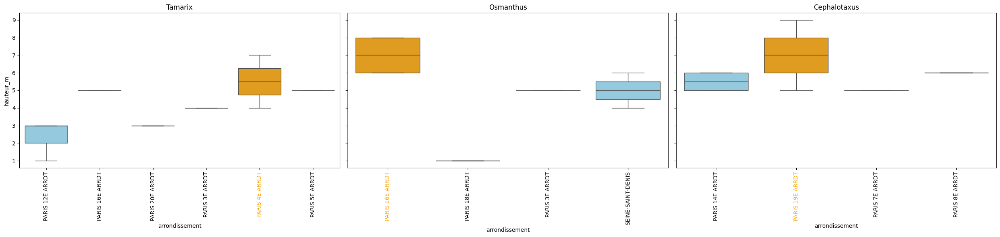

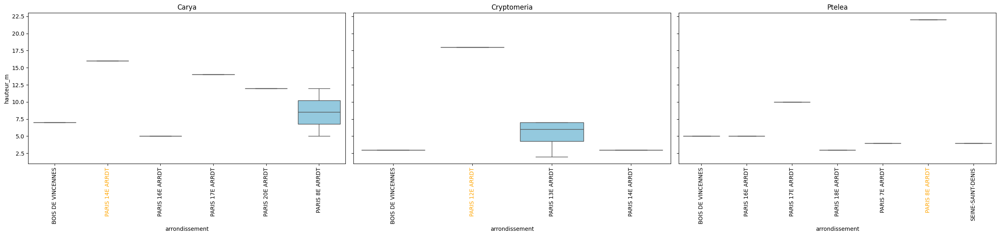

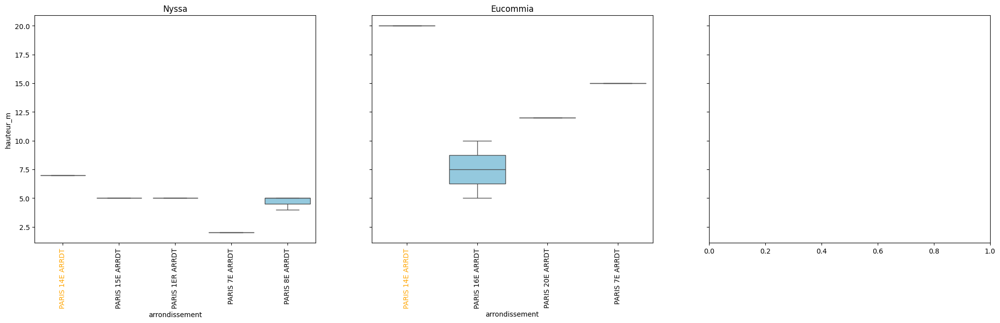

In [101]:
# Crée une figure avec 1 ligne et 3 colonnes

fig, axes = plt.subplots(1, 3, figsize=(25, 6), sharey=True)
# Boucle pour chaque genre unique et affiche chaque boxplot dans un sous-graphe
i=0
for value in df_final["genre"].unique():
    if i==3:
        i=0
        plt.tight_layout()
        plt.show()
        fig, axes = plt.subplots(1, 3, figsize=(25, 6), sharey=True)
    df_temp = df_final[df_final["genre"] == value].sort_values(by="arrondissement")
    if len(df_temp["arrondissement"].unique()) <= 3:
        continue
    median_by_arr = df_temp.groupby("arrondissement")["hauteur_m"].median()
    
    max_median_arr_idmax = median_by_arr.idxmax()

    sns.boxplot(data=df_temp, x="arrondissement", y="hauteur_m",ax=axes[i], palette=[
            'orange' if arr == max_median_arr_idmax else 'skyblue'
            for arr in df_temp['arrondissement'].unique()
        ])
    axes[i].set_title(label=value)
    axes[i].tick_params(axis='x', rotation=90)

    for tick_label in axes[i].get_xticklabels():
        if tick_label.get_text() == max_median_arr_idmax:
            tick_label.set_color("orange")

    
    i+=1

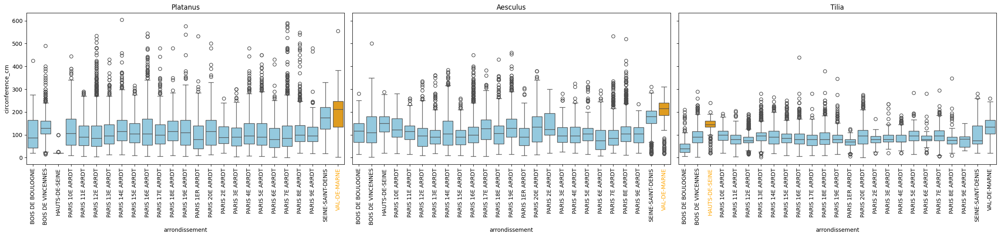

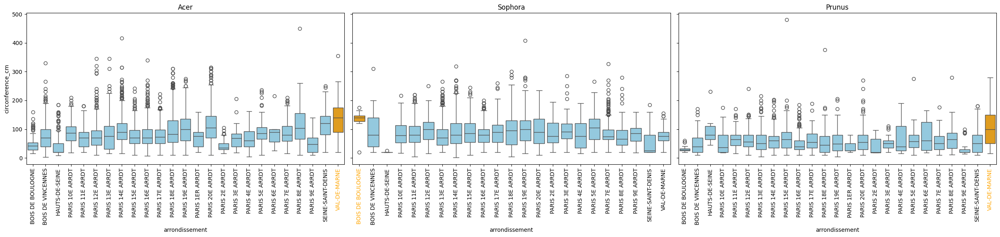

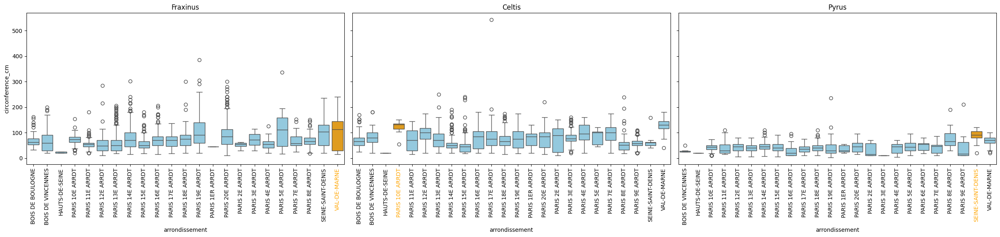

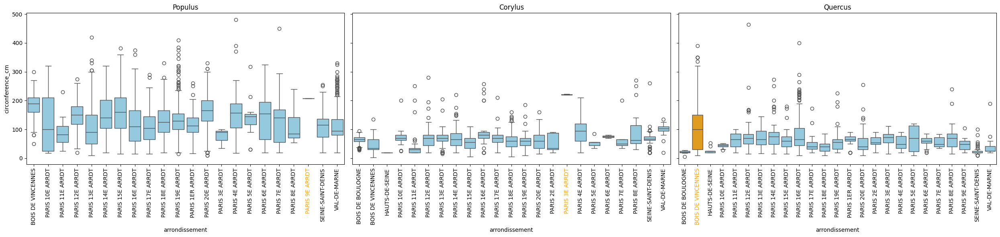

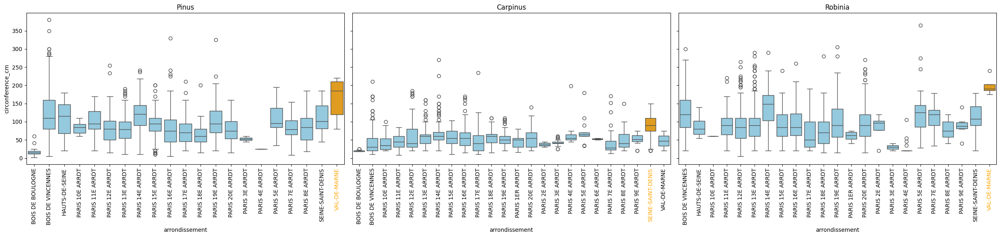

...

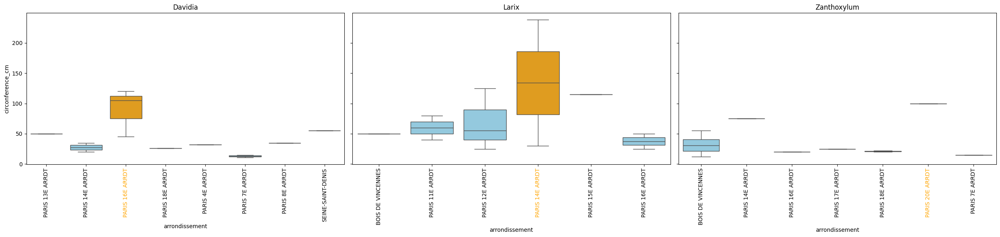

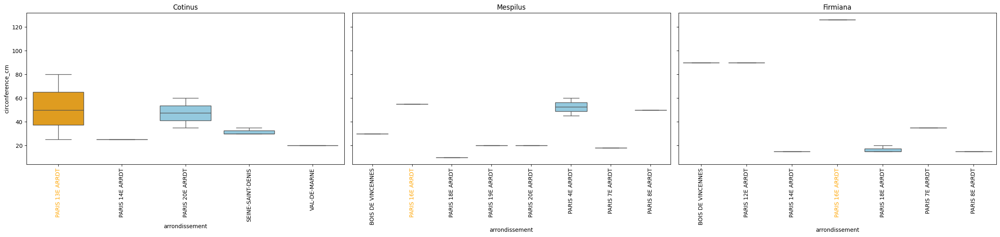

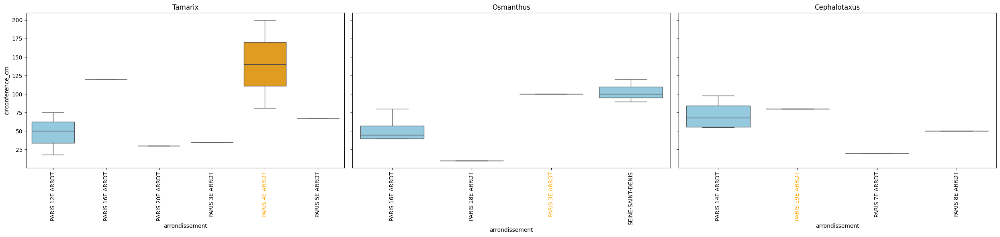

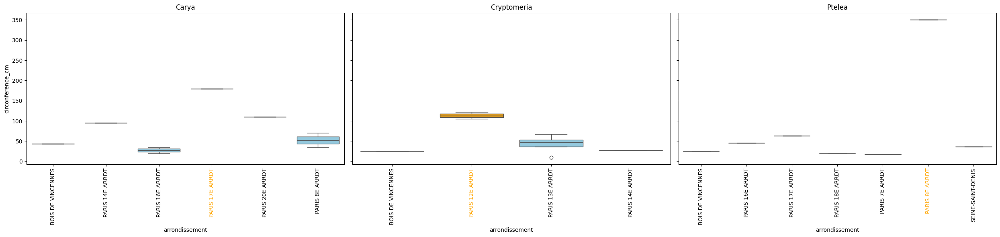

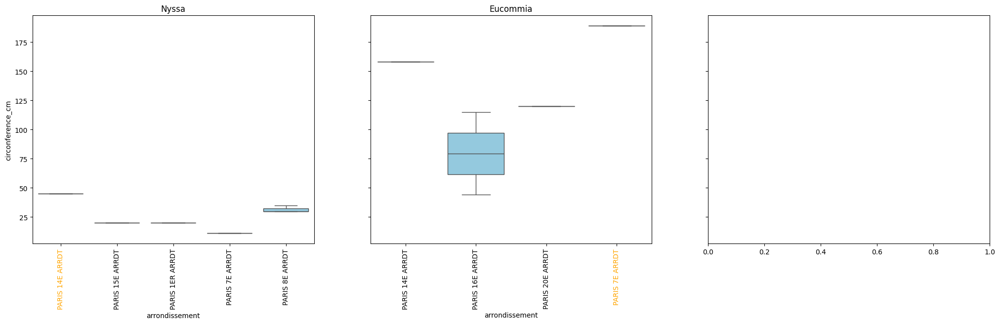

In [102]:
# Crée une figure avec 1 ligne et 3 colonnes

fig, axes = plt.subplots(1, 3, figsize=(25, 6), sharey=True)
# Boucle pour chaque genre unique et affiche chaque boxplot dans un sous-graphe
i=0
for value in df_final["genre"].unique():
    if i==3:
        i=0
        plt.tight_layout()
        plt.show()
        fig, axes = plt.subplots(1, 3, figsize=(25, 6), sharey=True)
    df_temp = df_final[df_final["genre"] == value].sort_values(by="arrondissement")
    if len(df_temp["arrondissement"].unique()) <= 3:
        continue
    median_by_arr = df_temp.groupby("arrondissement")["circonference_cm"].median()
    
    max_median_arr_idmax = median_by_arr.idxmax()

    sns.boxplot(data=df_temp, x="arrondissement", y="circonference_cm",ax=axes[i], palette=[
            'orange' if arr == max_median_arr_idmax else 'skyblue'
            for arr in df_temp['arrondissement'].unique()
        ])
    axes[i].set_title(label=value)
    axes[i].tick_params(axis='x', rotation=90)

    for tick_label in axes[i].get_xticklabels():
        if tick_label.get_text() == max_median_arr_idmax:
            tick_label.set_color("orange")

    
    i+=1

la répartition des circonférences des arbres par rapport à leur hauteur reste à oroximativement les meme

peu importe l'arrondissement 

### 8.Visualisation de la hauteur et de la circonférence et du stade de développement par raport a la variable dominialite 

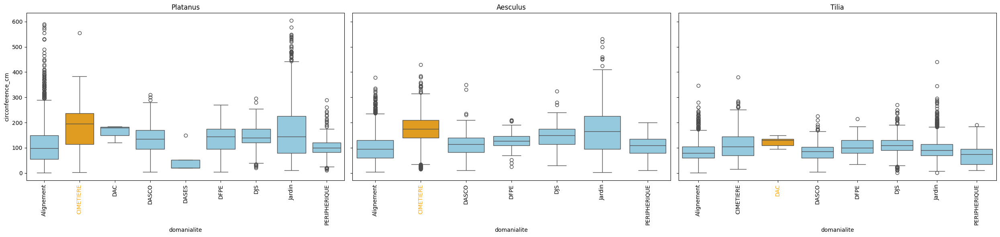

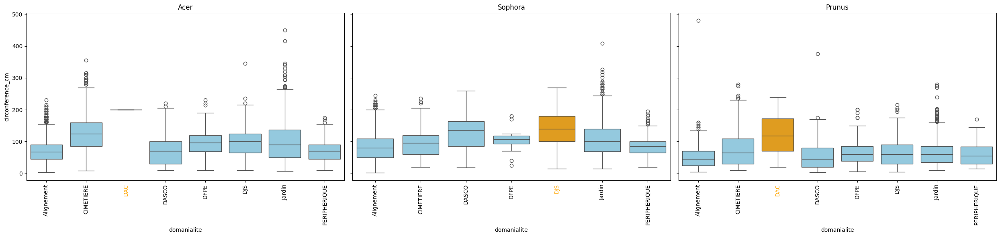

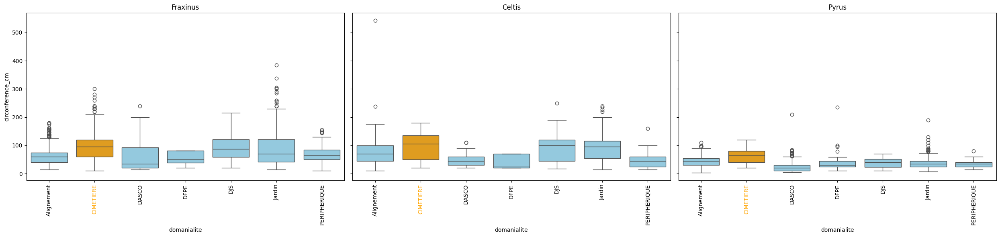

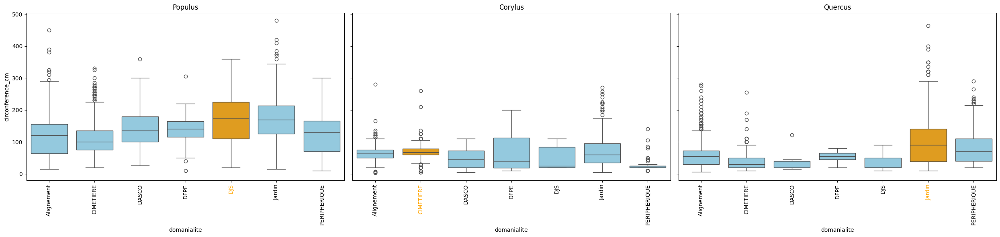

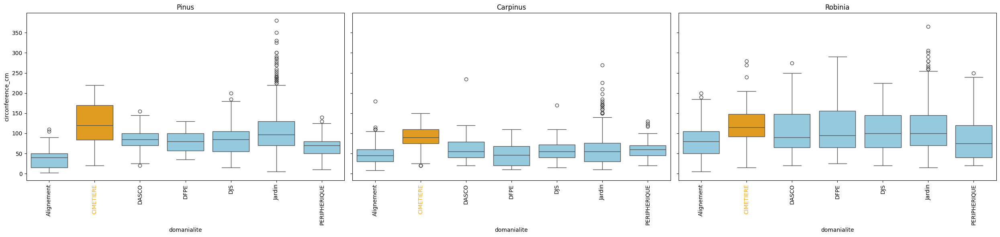

...

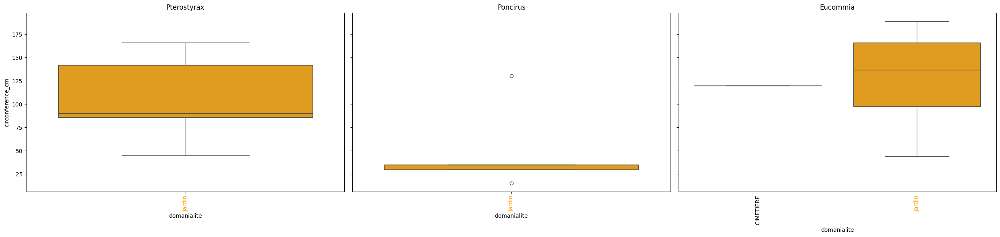

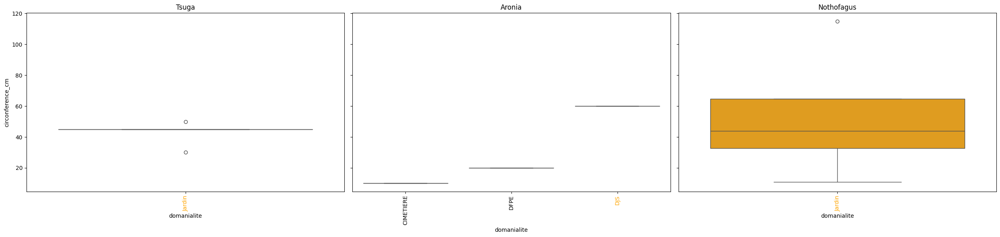

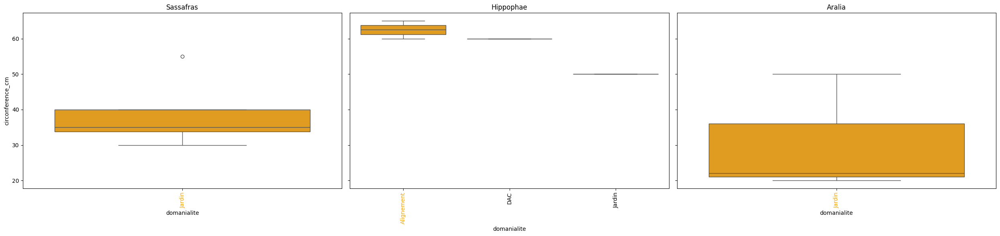

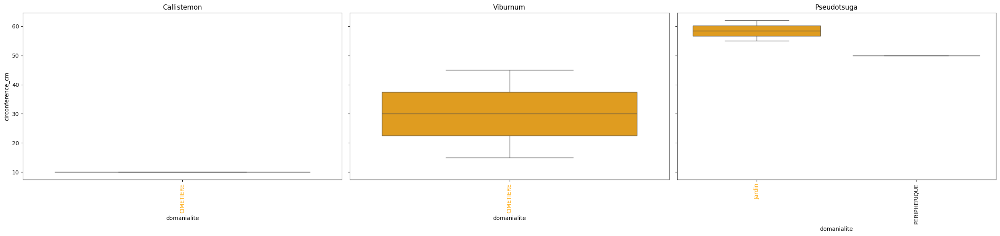

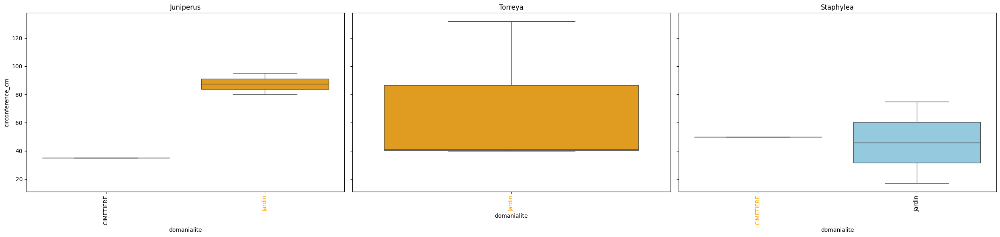

C:\Users\theo\AppData\Local\Temp\ipykernel_13408\2284900251.py:18: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  sns.boxplot(data=df_temp, x="domanialite", y="circonference_cm",ax=axes[i], palette=[


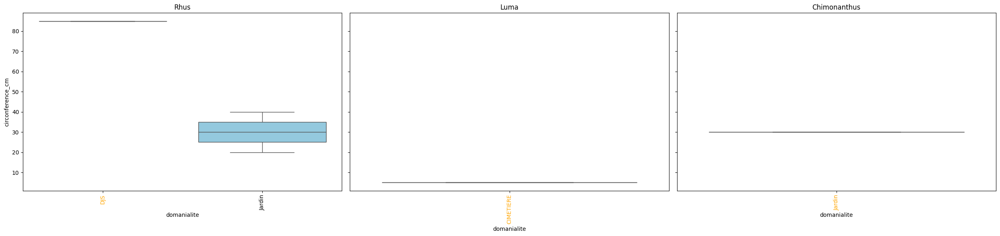

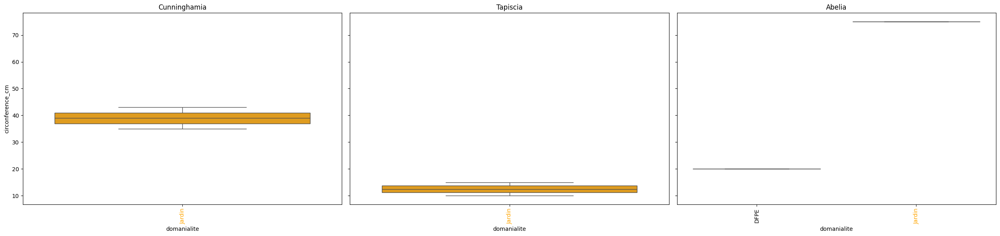

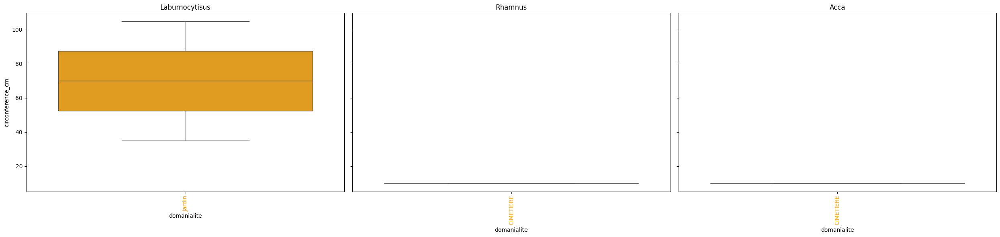

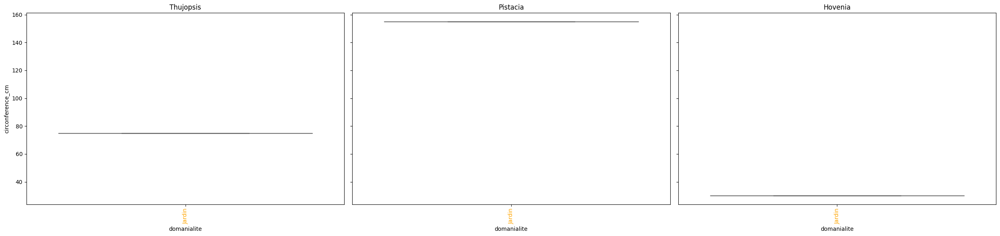

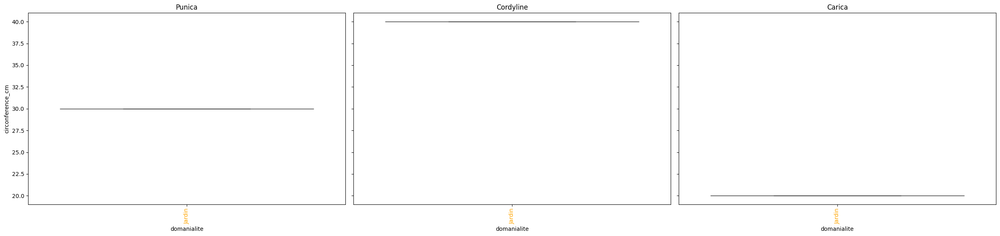

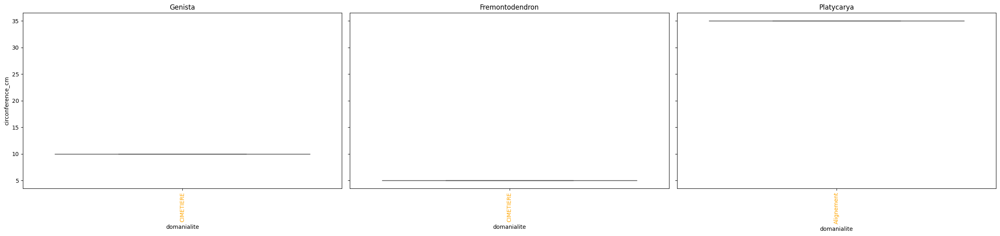

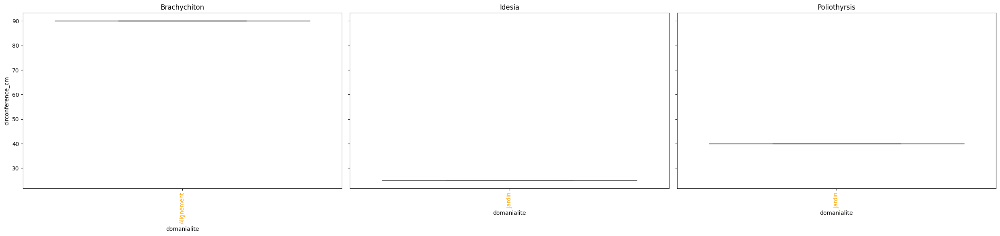

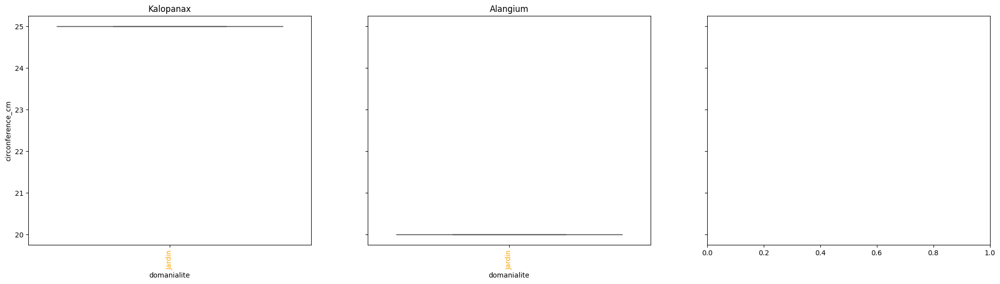

In [103]:


# Crée une figure avec 1 ligne et 3 colonnes

fig, axes = plt.subplots(1, 3, figsize=(25, 6), sharey=True)
# Boucle pour chaque genre unique et affiche chaque boxplot dans un sous-graphe
i=0
for value in df_final["genre"].unique():
    if i==3:
        i=0
        plt.tight_layout()
        plt.show()
        fig, axes = plt.subplots(1, 3, figsize=(25, 6), sharey=True)
    df_temp = df_final[df_final["genre"] == value].sort_values(by="domanialite")
    
    median_by_arr = df_temp.groupby("domanialite")["circonference_cm"].median()
    
    max_median_arr_idmax = median_by_arr.idxmax()

    sns.boxplot(data=df_temp, x="domanialite", y="circonference_cm",ax=axes[i], palette=[
            'orange' if arr == max_median_arr_idmax else 'skyblue'
            for arr in df_temp['domanialite'].unique()
        ])
    axes[i].set_title(label=value)
    axes[i].tick_params(axis='x', rotation=90)

    for tick_label in axes[i].get_xticklabels():
        if tick_label.get_text() == max_median_arr_idmax:
            tick_label.set_color("orange")

    
    i+=1


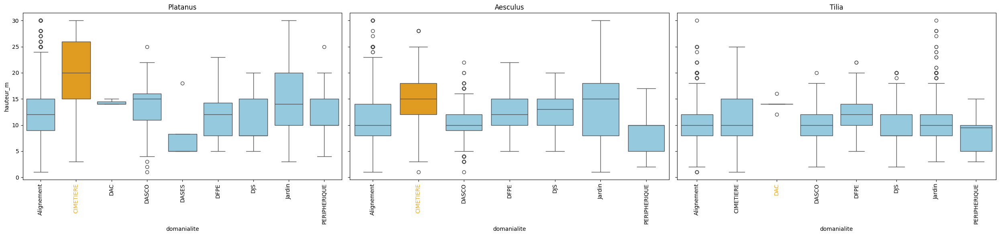

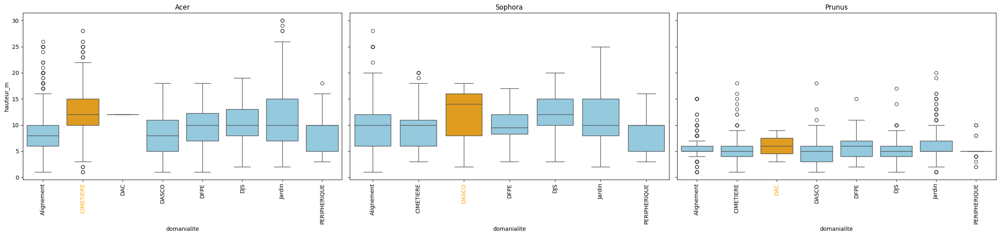

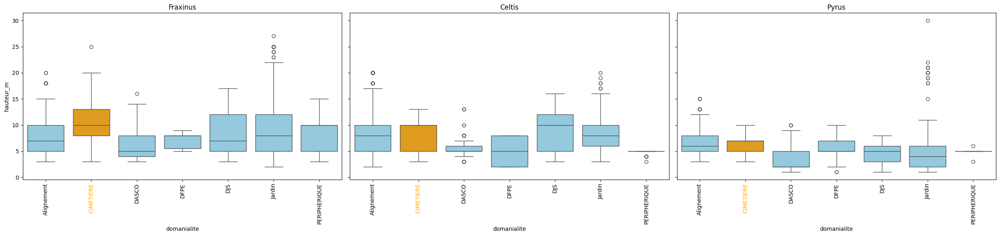

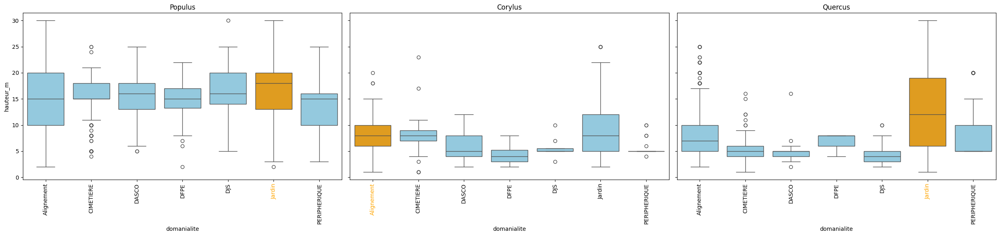

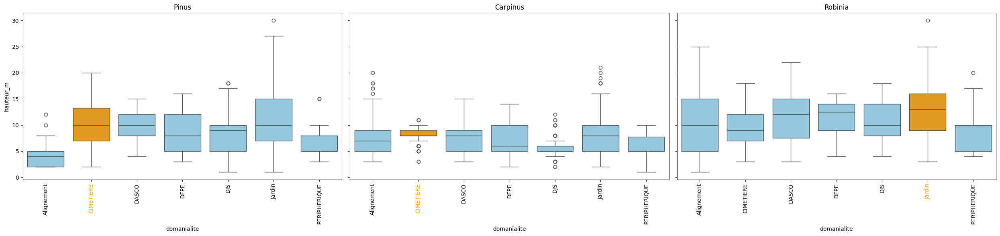

...

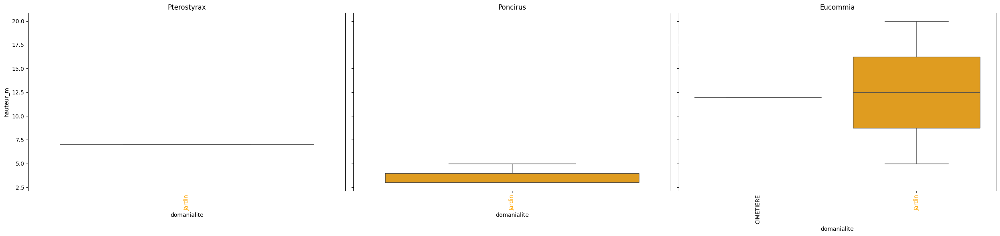

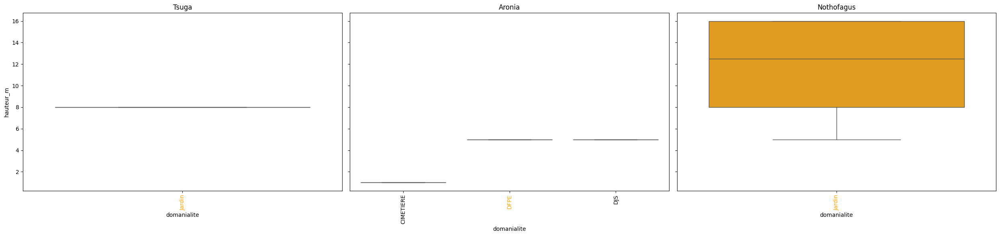

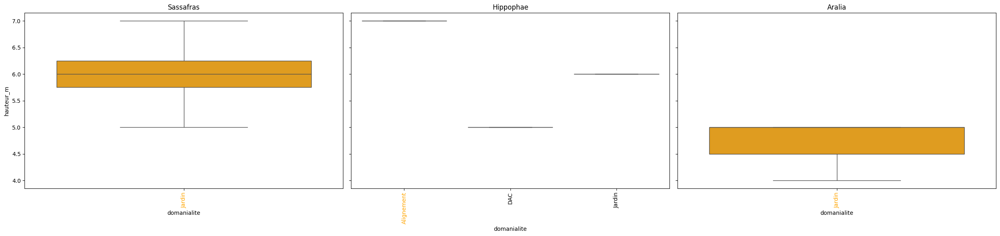

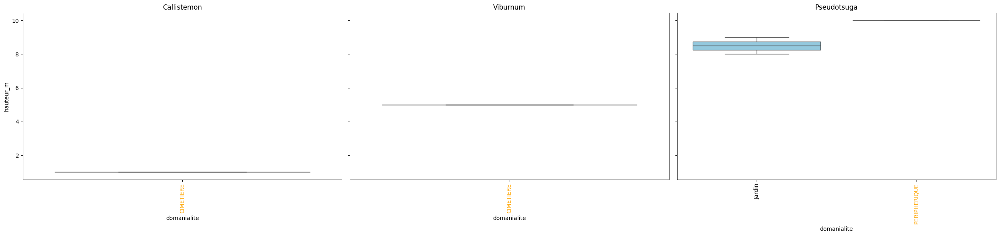

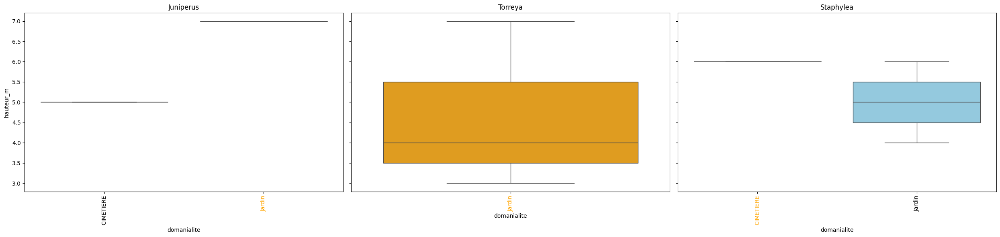

C:\Users\theo\AppData\Local\Temp\ipykernel_13408\3729612168.py:18: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  sns.boxplot(data=df_temp, x="domanialite", y="hauteur_m",ax=axes[i], palette=[


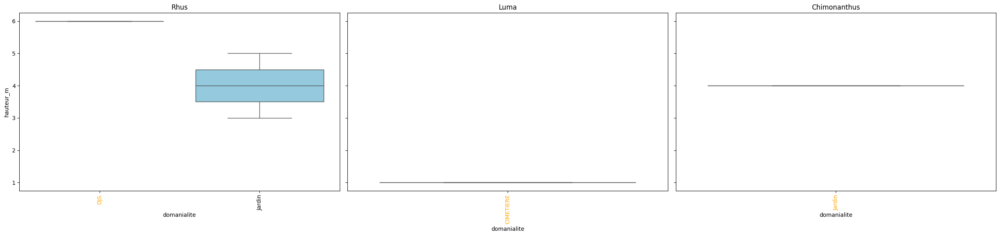

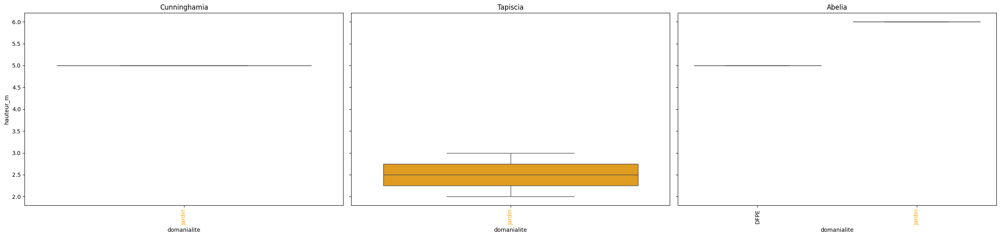

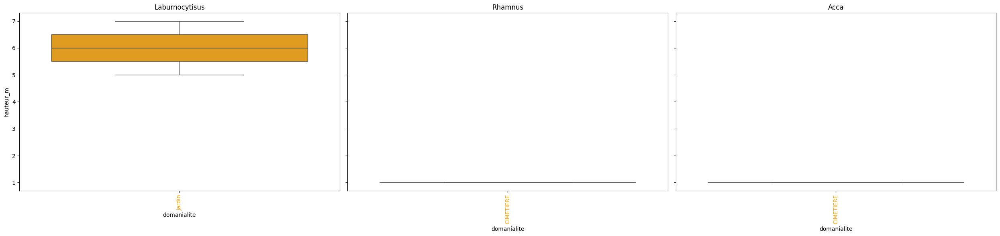

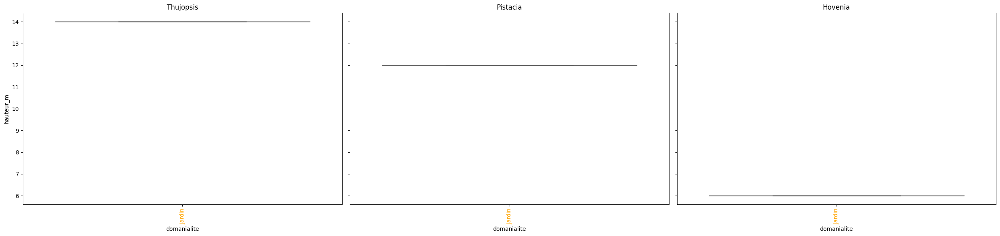

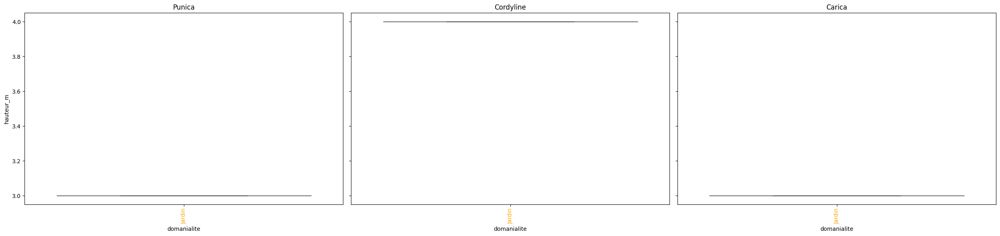

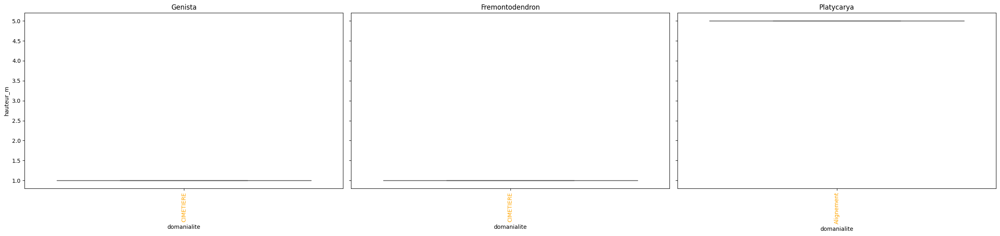

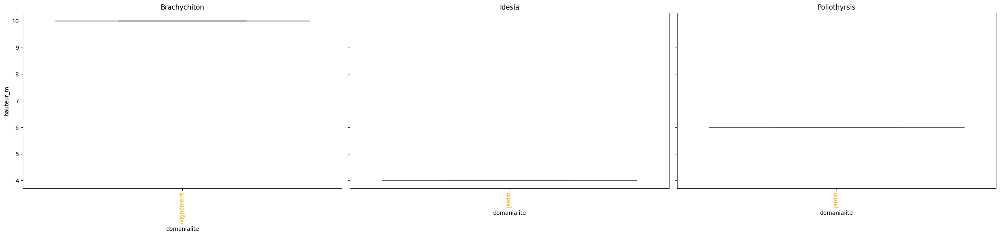

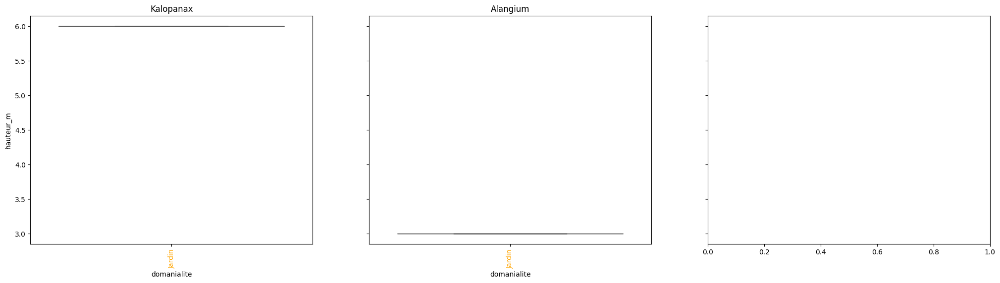

In [104]:
# Crée une figure avec 1 ligne et 3 colonnes

fig, axes = plt.subplots(1, 3, figsize=(25, 6), sharey=True)
# Boucle pour chaque genre unique et affiche chaque boxplot dans un sous-graphe
i=0
for value in df_final["genre"].unique():
    if i==3:
        i=0
        plt.tight_layout()
        plt.show()
        fig, axes = plt.subplots(1, 3, figsize=(25, 6), sharey=True)
    df_temp = df_final[df_final["genre"] == value].sort_values(by="domanialite")
    
    median_by_arr = df_temp.groupby("domanialite")["hauteur_m"].median()
    
    max_median_arr_idmax = median_by_arr.idxmax()

    sns.boxplot(data=df_temp, x="domanialite", y="hauteur_m",ax=axes[i], palette=[
            'orange' if arr == max_median_arr_idmax else 'skyblue'
            for arr in df_temp['domanialite'].unique()
        ])
    axes[i].set_title(label=value)
    axes[i].tick_params(axis='x', rotation=90)

    for tick_label in axes[i].get_xticklabels():
        if tick_label.get_text() == max_median_arr_idmax:
            tick_label.set_color("orange")

    
    i+=1

On suppose que la différence de hauteur entre deux arbres induit plus de différence 

d'entretiens que la différence de circonférences

In [105]:

df_final['height_category'] = pd.qcut(df_final["hauteur_m"],
                                      q=4, labels=['Bas', 'Moyen-Bas',
                                                   'Moyen-Haut', 'Haut'])


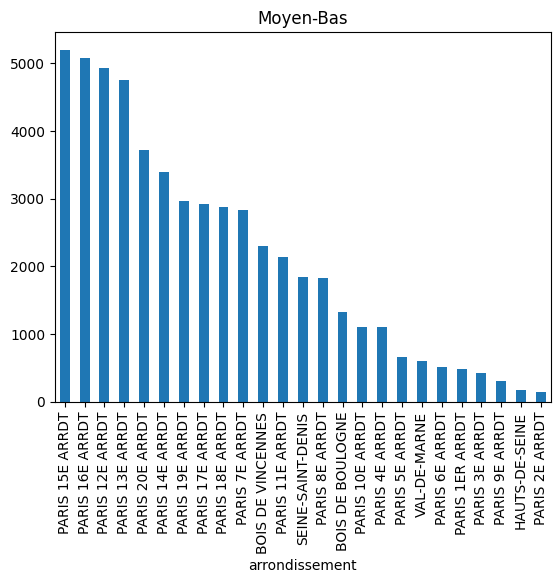

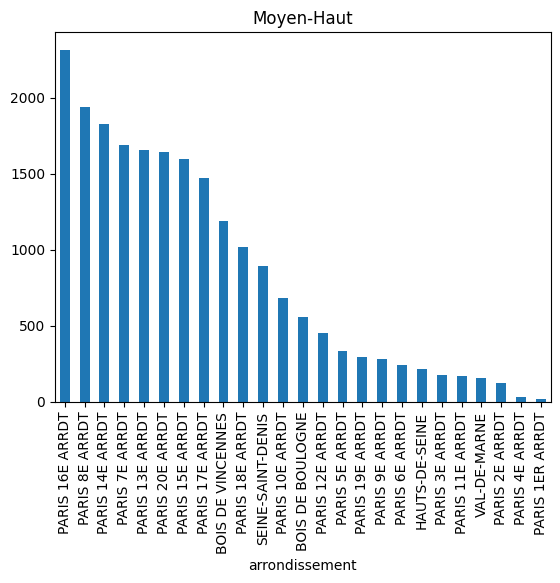

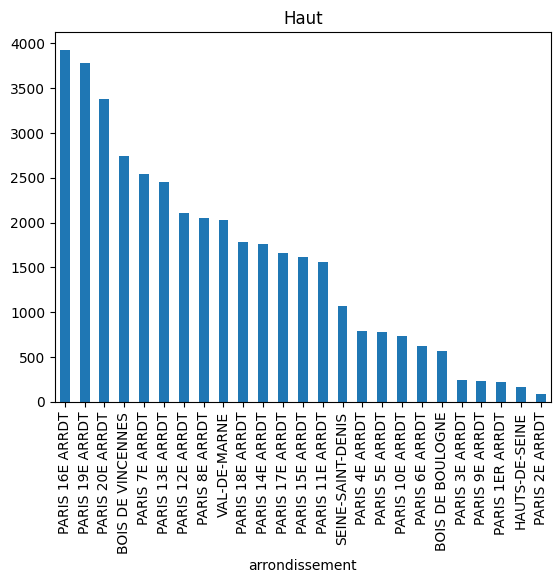

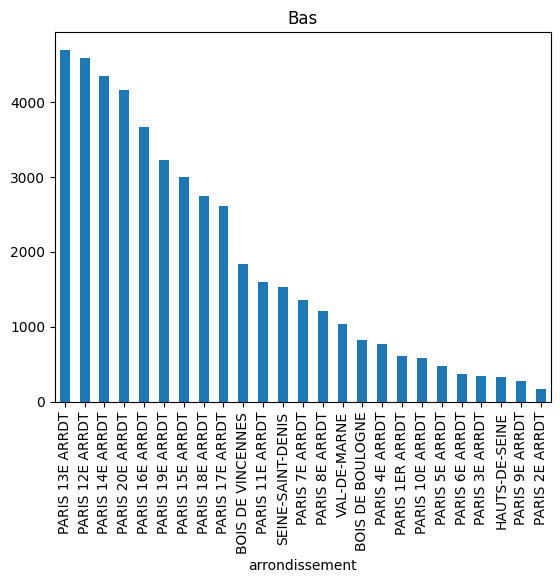

In [106]:
for value in df_final["height_category"].unique():
    mask = df_final["height_category"] == value
    df_final.loc[(mask)]["arrondissement"].value_counts().plot(kind="bar")
    plt.title(value)
    plt.show()

In [107]:
df_final

,circonference_cm,hauteur_m,domanialite,arrondissement,genre,espece,stade_developpement,remarquable,height_category
68566,135,10,DASCO,PARIS 15E ARRDT,Platanus,x hispanica,A,0.0,Moyen-Bas
156291,135,14,Alignement,PARIS 16E ARRDT,Platanus,x hispanica,A,0.0,Moyen-Haut
156289,66,10,Alignement,PARIS 8E ARRDT,Platanus,x hispanica,A,0.0,Moyen-Bas
156288,165,15,Alignement,PARIS 17E ARRDT,Platanus,x hispanica,A,0.0,Haut
156286,140,15,Alignement,PARIS 17E ARRDT,Platanus,x hispanica,A,0.0,Haut
...,...,...,...,...,...,...,...,...,...
139203,90,10,Alignement,PARIS 16E ARRDT,Brachychiton,acerifolius,A,0.0,Moyen-Bas
177838,25,4,Jardin,PARIS 8E ARRDT,Idesia,polycarpa,J,0.0,Bas
189024,40,6,Jardin,BOIS DE VINCENNES,Poliothyrsis,sinensis,J,0.0,Bas
192698,25,6,Jardin,BOIS DE VINCENNES,Kalopanax,septemlobus,J,0.0,Bas


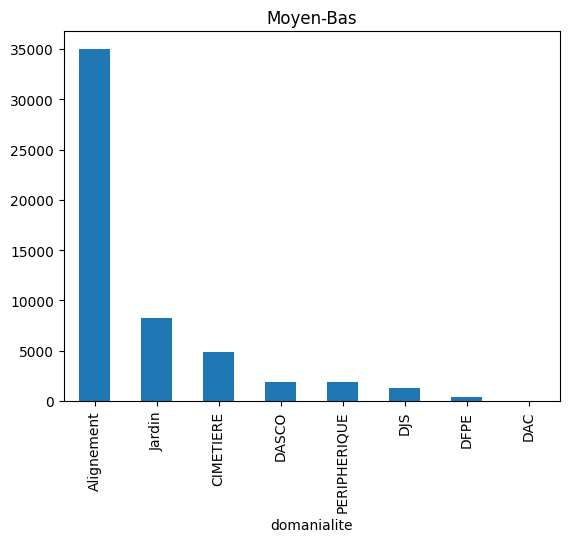

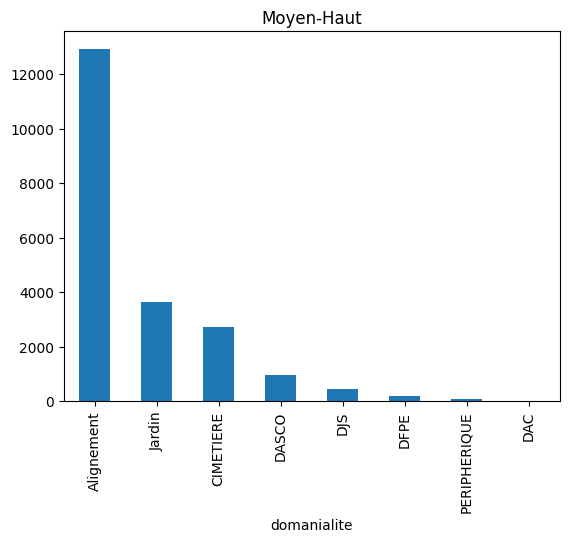

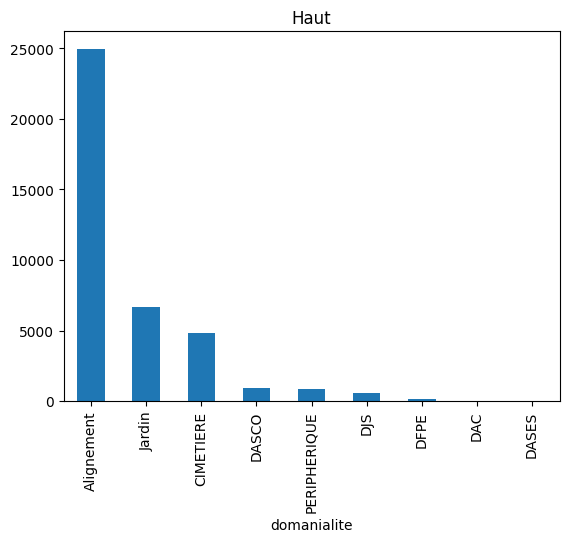

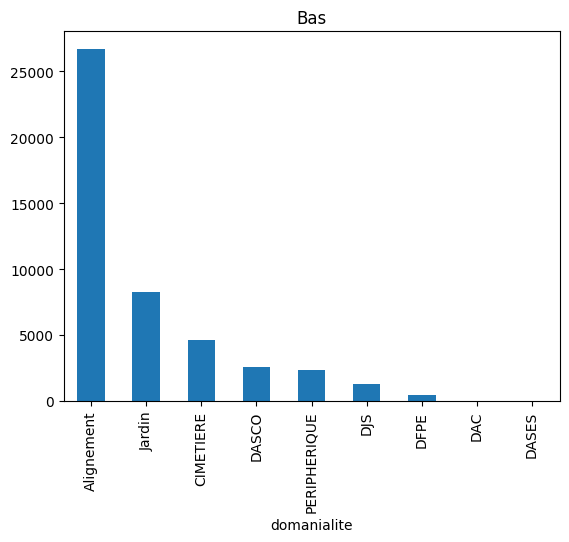

In [108]:
for value in df_final["height_category"].unique():
    mask = df_final["height_category"] == value
    df_final.loc[(mask)]["domanialite"].value_counts().plot(kind="bar")
    plt.title(value)
    plt.show()

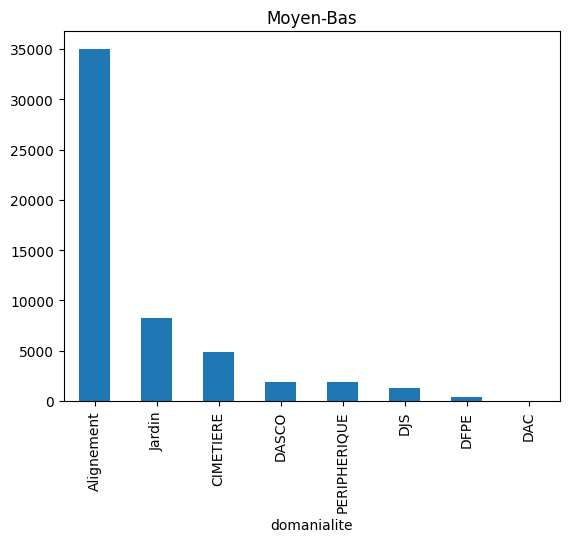

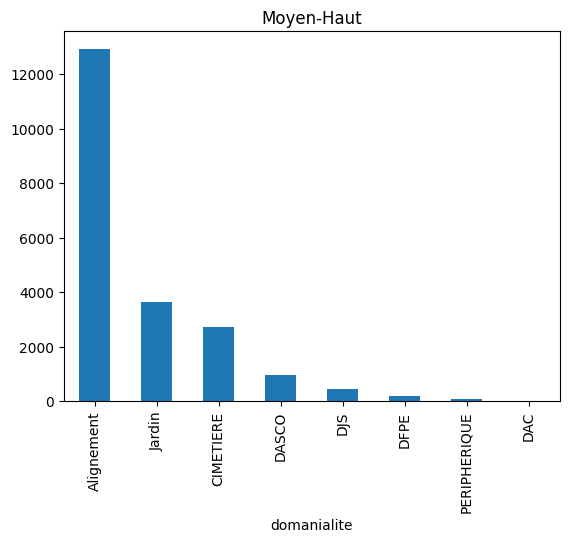

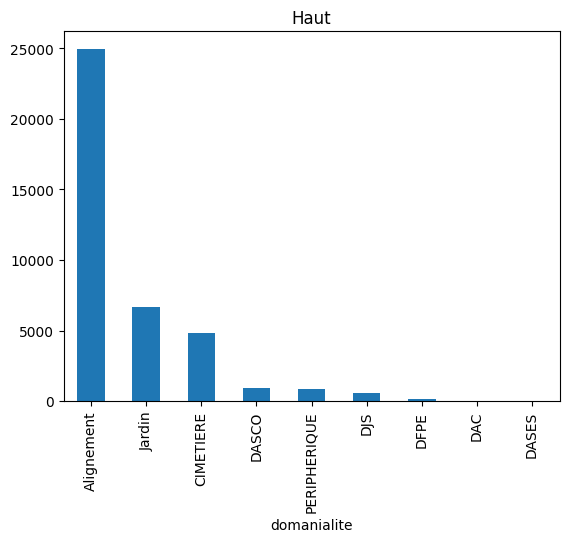

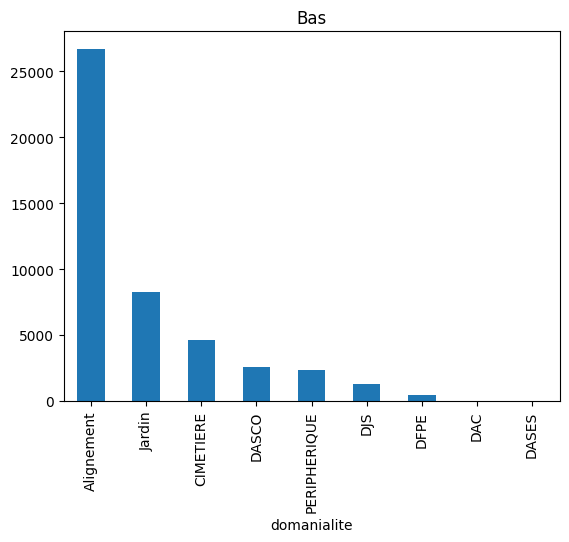

In [109]:
for value in df_final["height_category"].unique():
    mask = df_final["height_category"] == value
    df_final.loc[(mask)]["domanialite"].value_counts().plot(kind="bar")
    plt.title(value)
    plt.show()

### 7. Conclusion et recommandations

En conclusion des arbres ne semble pas avoir d'endroit où ils se développe mieux à paris

Catégorie Moyen-Bas : Les arrondissements tels que le 15e, le 16e, et le 12e ont une forte concentration d'arbres de hauteur moyenne-basse. Ces arrondissements semblent donc nécessiter des tournées d'entretien relativement fréquentes pour les arbres de petite taille, qui pourraient avoir besoin de soins réguliers (élagage léger, vérification de la santé, etc.).

Catégorie Moyen-Haut : On observe que les arrondissements avec la plus forte concentration d'arbres de taille moyenne-haute sont encore le 16e et le 15e. Cependant, on note aussi une densité importante dans le 8e et le 7e arrondissements. Les arbres de cette catégorie de hauteur peuvent demander des interventions plus spécifiques, comme des tailles structurales ou des vérifications de sécurité, mais moins souvent qu’en Moyen-Bas.

Catégorie Haut : Les arbres les plus grands sont surtout concentrés dans le 16e, le 19e, le 20e arrondissements ainsi que dans les bois comme le Bois de Vincennes. Ces grands arbres nécessitent souvent des soins spécialisés, par exemple des inspections régulières pour prévenir des chutes de branches et maintenir la sécurité dans les zones publiques, ce qui implique des tournées d'entretien avec des équipes spécialisées.